# Project: Vehicle-Detection

In [1]:
# Load helper function from yolo_utils.py
from utils.yolo_utils import *

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


## 1. Load test images

In [2]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
%matplotlib inline

# Plot the images in the specific folder
def visualize(filename, a):
    fig, axes = plt.subplots(2,3,figsize=(24,12),subplot_kw={'xticks':[],'yticks':[]})
    fig.subplots_adjust(hspace=0.03, wspace=0.05)
    for p in zip(sum(axes.tolist(),[]), a):
        p[0].imshow(p[1],cmap='gray')
    plt.tight_layout()
    fig.savefig(filename)
    plt.show()
    return p[1].shape

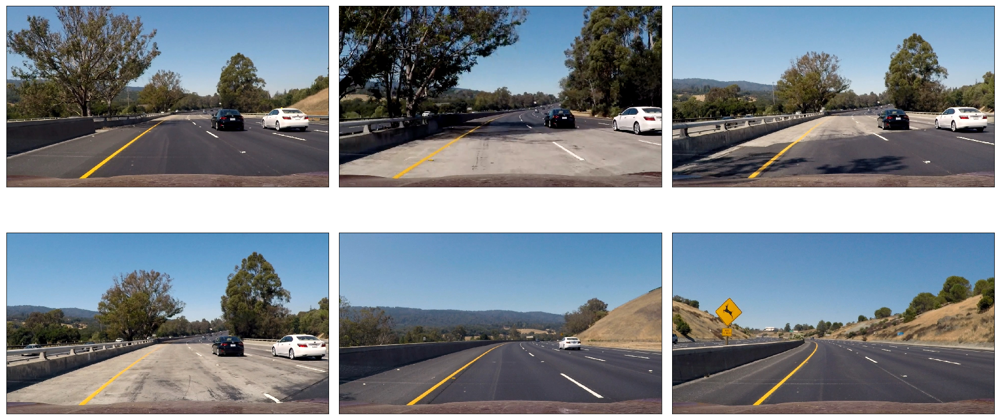

Image size: (720, 1280, 3)


In [3]:
import glob
import matplotlib.image as mpimg

image_shape = visualize("output_images/test_images.jpg",
            (mpimg.imread(f) for f in (glob.glob("test_images/test*.jpg"))))
print("Image size: " + str(image_shape))

## 2. Filtering with threshold on class scores

In [4]:
import tensorflow as tf
from keras import backend as K

def yolo_filter_boxes(box_confidence, boxes, box_class_probs, threshold=.6):
    """Filters YOLO boxes by thresholding on object and class confidence.

    Arguments:
    box_confidence -- tensor of shape (19, 19, 5, 1)
    boxes -- tensor of shape (19, 19, 5, 4)
    box_class_probs -- tensor of shape (19, 19, 5, 80)
    threshold -- real value, if [ highest class probability score < threshold], then get rid of the corresponding box

    Returns:
    scores -- tensor of shape (None,), containing the class probability score for selected boxes
    boxes -- tensor of shape (None, 4), containing (b_x, b_y, b_h, b_w) coordinates of selected boxes
    classes -- tensor of shape (None,), containing the index of the class detected by the selected boxes

    Note: "None" is here because you don't know the exact number of selected boxes, as it depends on the threshold.
    For example, the actual output size of scores would be (10,) if there are 10 boxes.
    """

    # Step 1: Compute box scores
    box_scores = tf.multiply(box_class_probs, box_confidence)

    # Step 2: Find the box_classes thanks to the max box_scores, keep track of the corresponding score
    box_classes = K.argmax(box_scores, axis=-1)
    box_class_scores = K.max(box_scores, axis=-1)

    # Step 3: Create a filtering mask based on "box_class_scores" by using "threshold". The mask should have the
    # same dimension as box_class_scores, and be True for the boxes you want to keep (with probability >= threshold)
    filtering_mask = box_class_scores > threshold

    # Step 4: Apply the mask to scores, boxes and classes
    scores = tf.boolean_mask(box_class_scores, filtering_mask)
    boxes = tf.boolean_mask(boxes, filtering_mask)
    classes = tf.boolean_mask(box_classes, filtering_mask)

    return scores, boxes, classes

## 3. Non-max Suppression: NMS

### 3.1 Intersection over Union: IoU

In [5]:
def iou(box1, box2):
    """Implement the intersection over union (IoU) between box1 and box2

    Arguments:
    box1 -- first box, list object with coordinates (x1, y1, x2, y2)
    box2 -- second box, list object with coordinates (x1, y1, x2, y2)
    """

    # Calculate the (y1, x1, y2, x2) coordinates of the intersection of box1 and box2. Calculate its Area.
    xi1 = max(box1[0], box2[0])
    yi1 = max(box1[1], box2[1])
    xi2 = min(box1[2], box2[2])
    yi2 = min(box1[3], box2[3])
    inter_area = (xi2 - xi1) * (yi2 - yi1)

    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - inter_area

    # compute the IoU
    iou = float(inter_area) / union_area

    return iou

In [6]:
def yolo_non_max_suppression(scores, boxes, classes, max_boxes=10, iou_threshold=0.5):
    """
    Applies Non-max suppression (NMS) to set of boxes

    Arguments:
    scores -- tensor of shape (None,), output of yolo_filter_boxes()
    boxes -- tensor of shape (None, 4), output of yolo_filter_boxes() that have been scaled to the image size (see later)
    classes -- tensor of shape (None,), output of yolo_filter_boxes()
    max_boxes -- integer, maximum number of predicted boxes you'd like
    iou_threshold -- real value, "intersection over union" threshold used for NMS filtering

    Returns:
    scores -- tensor of shape (, None), predicted score for each box
    boxes -- tensor of shape (4, None), predicted box coordinates
    classes -- tensor of shape (, None), predicted class for each box

    Note: The "None" dimension of the output tensors has obviously to be less than max_boxes. Note also that this
    function will transpose the shapes of scores, boxes, classes. This is made for convenience.
    """

    # tensor to be used in tf.image.non_max_suppression()
    max_boxes_tensor = K.variable(max_boxes, dtype='int32')  
    # initialize variable max_boxes_tensor
    K.get_session().run(tf.variables_initializer([max_boxes_tensor]))  

    # Use tf.image.non_max_suppression() to get the list of indices corresponding to boxes you keep
    nms_indices = tf.image.non_max_suppression(boxes=boxes, scores=scores, max_output_size=max_boxes,
                                               iou_threshold=iou_threshold)

    # Use K.gather() to select only nms_indices from scores, boxes and classes
    scores = K.gather(scores, nms_indices)
    boxes = K.gather(boxes, nms_indices)
    classes = K.gather(classes, nms_indices)

    return scores, boxes, classes

## 4. Wrapping up the filtering

In [7]:
def yolo_eval(yolo_outputs, image_shape=(720., 1280.), max_boxes=10, score_threshold=.5, iou_threshold=.5):
    """
    Converts the output of YOLO encoding (a lot of boxes) to your predicted boxes along with their scores, box coordinates and classes.

    Arguments:
    yolo_outputs -- output of the encoding model (for image_shape of (608, 608, 3)), contains 4 tensors:
                    box_confidence: tensor of shape (None, 19, 19, 5, 1)
                    box_xy: tensor of shape (None, 19, 19, 5, 2)
                    box_wh: tensor of shape (None, 19, 19, 5, 2)
                    box_class_probs: tensor of shape (None, 19, 19, 5, 80)
    image_shape -- tensor of shape (2,) containing the input shape, in this notebook we use (608., 608.) (has to be float32 dtype)
    max_boxes -- integer, maximum number of predicted boxes you'd like
    score_threshold -- real value, if [ highest class probability score < threshold], then get rid of the corresponding box
    iou_threshold -- real value, "intersection over union" threshold used for NMS filtering

    Returns:
    scores -- tensor of shape (None, ), predicted score for each box
    boxes -- tensor of shape (None, 4), predicted box coordinates
    classes -- tensor of shape (None,), predicted class for each box
    """

    # Retrieve outputs of the YOLO model
    box_xy, box_wh, box_confidence, box_class_probs = yolo_outputs

    # Convert boxes to be ready for filtering functions
    boxes = yolo_boxes_to_corners(box_xy, box_wh)

    # Use one of the functions implemented to perform Score-filtering with a threshold of score_threshold
    scores, boxes, classes = yolo_filter_boxes(box_class_probs=box_class_probs, box_confidence=box_confidence,
                                               boxes=boxes)

    # Scale boxes back to original image shape.
    boxes = scale_boxes(boxes, image_shape)

    # Use one of the functions you've implemented to perform Non-max suppression with a threshold of iou_threshold (≈1 line)
    scores, boxes, classes = yolo_non_max_suppression(boxes=boxes, classes=classes, scores=scores)

    return scores, boxes, classes

## 5. Test on Images

### 5.1 Defining classes, anchors and image shape

In [8]:
# TXT includes 80 classes information
class_names = read_classes("model_data/coco_classes.txt")
# TXT includes 5 boxes
anchors = read_anchors("model_data/yolo_anchors.txt")
# Define image shape
image_shape = (720., 1280.)

### 5.2 Load pretrained model

In [9]:
from keras.models import load_model, Model

yolo_model = load_model('model_data/yolo.h5')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/engine/saving.py:270: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [10]:
yolo_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 608, 608, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 608, 608, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 608, 608, 32) 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
leaky_re_lu_1 (LeakyReLU)       (None, 608, 608, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
max_poolin

### 5.3 Convert output of the model to usable bounding box tensors

In [11]:
yolo_outputs = yolo_head(yolo_model.output, anchors, len(class_names))

### 5.4 Filter boxes

In [12]:
scores, boxes, all_classes = yolo_eval(yolo_outputs, image_shape)

### 5.5 Run on images

In [13]:
def predict(sess, image, printlabel, scores, boxes, classes, class_names):
    """
    Runs the graph stored in "sess" to predict boxes for "image_file". Prints and plots the preditions.
    
    Arguments:
    sess -- your tensorflow/Keras session containing the YOLO graph
    image_file -- name of an image stored in the "images" folder.
    
    Returns:
    out_scores -- tensor of shape (None, ), scores of the predicted boxes
    out_boxes -- tensor of shape (None, 4), coordinates of the predicted boxes
    out_classes -- tensor of shape (None, ), class index of the predicted boxes
    
    Note: "None" actually represents the number of predicted boxes, it varies between 0 and max_boxes. 
    """

    # Preprocess your image
    image, image_data = preprocess_image(image, model_image_size = (608, 608))
    
    # Run the session with the correct tensors and choose the correct placeholders in the feed_dict.
    # need to use feed_dict={yolo_model.input: ... , K.learning_phase(): 0})
    out_scores, out_boxes, out_classes = sess.run(
        [scores, boxes, classes], 
        feed_dict={yolo_model.input:image_data, K.learning_phase():0})

    colors = generate_colors(class_names)
    # Draw bounding boxes on the image file
    draw_boxes(image, out_scores, out_boxes, out_classes, class_names, colors=colors, printlabel=printlabel)
    
    return out_scores, out_boxes, out_classes, image

In [14]:
sess = K.get_session()

car 0.81 (1014, 408) (1209, 496)
car 0.81 (818, 419) (944, 496)
Found 2 boxes for test_images/test6.jpg


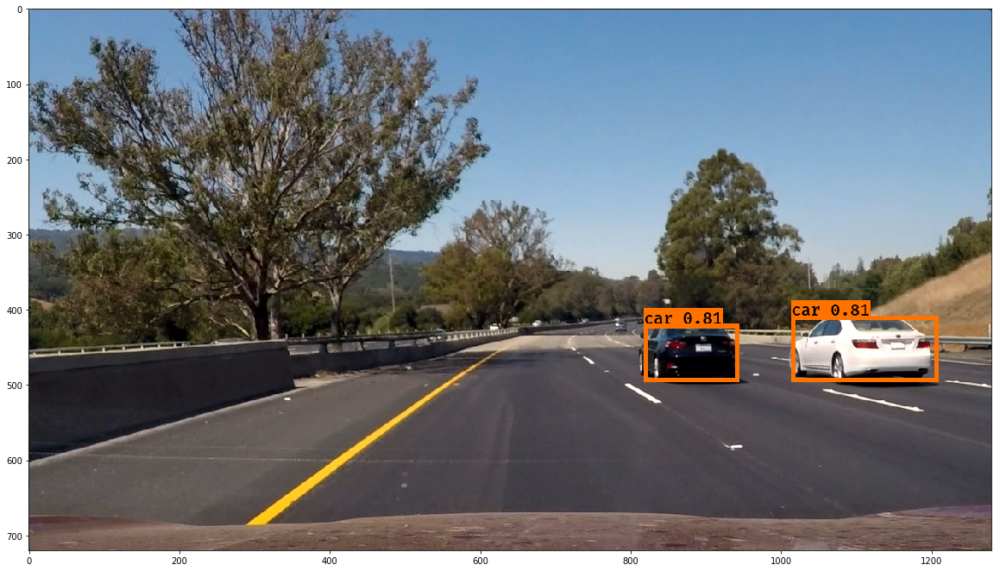

car 0.83 (816, 410) (942, 490)
car 0.85 (1085, 400) (1280, 514)
Found 2 boxes for test_images/test5.jpg


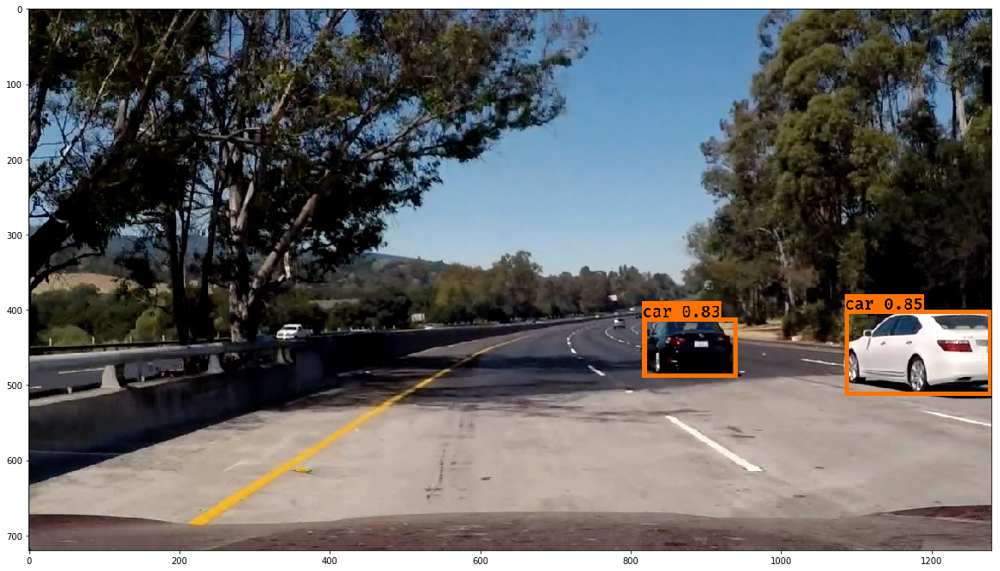

car 0.72 (824, 423) (941, 492)
car 0.79 (1044, 399) (1252, 503)
Found 2 boxes for test_images/test4.jpg


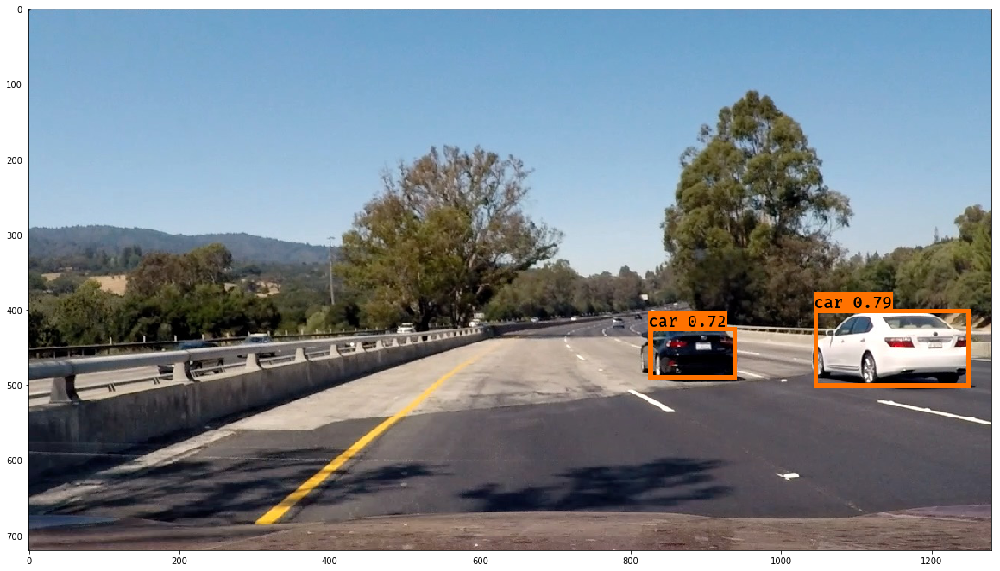

car 0.79 (1047, 405) (1259, 510)
car 0.80 (822, 413) (941, 488)
Found 2 boxes for test_images/test1.jpg


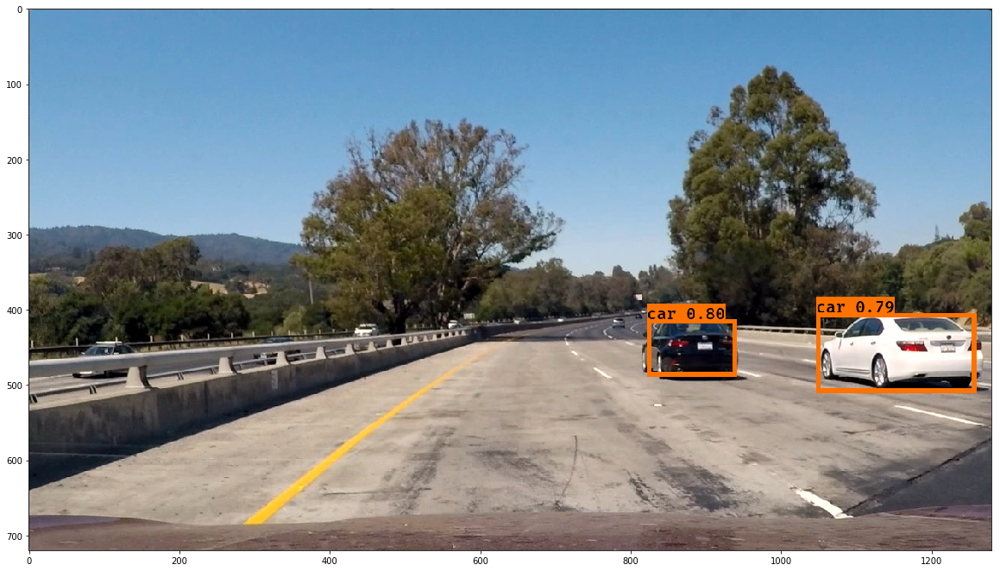

Found 0 boxes for test_images/test3.jpg


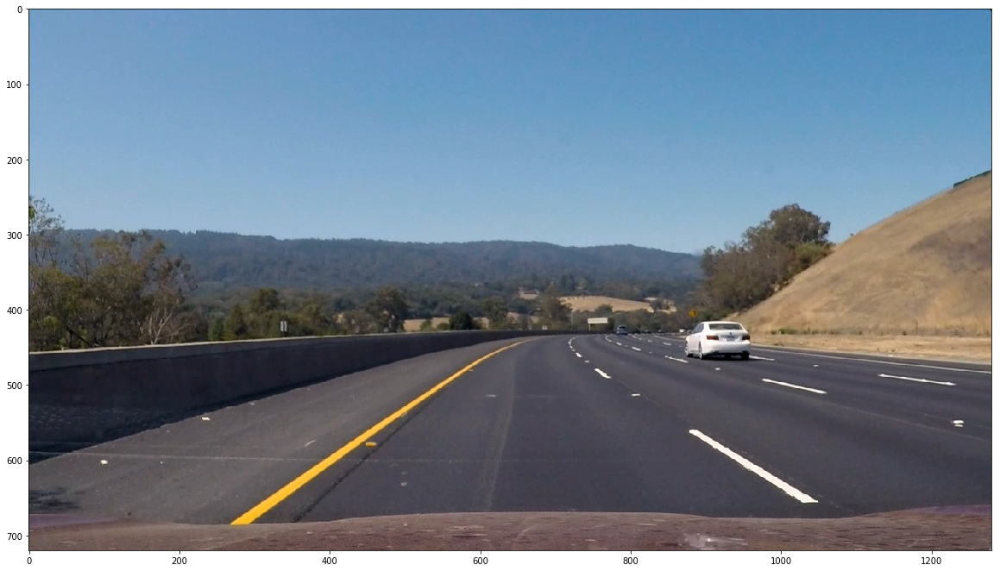

Found 0 boxes for test_images/test2.jpg


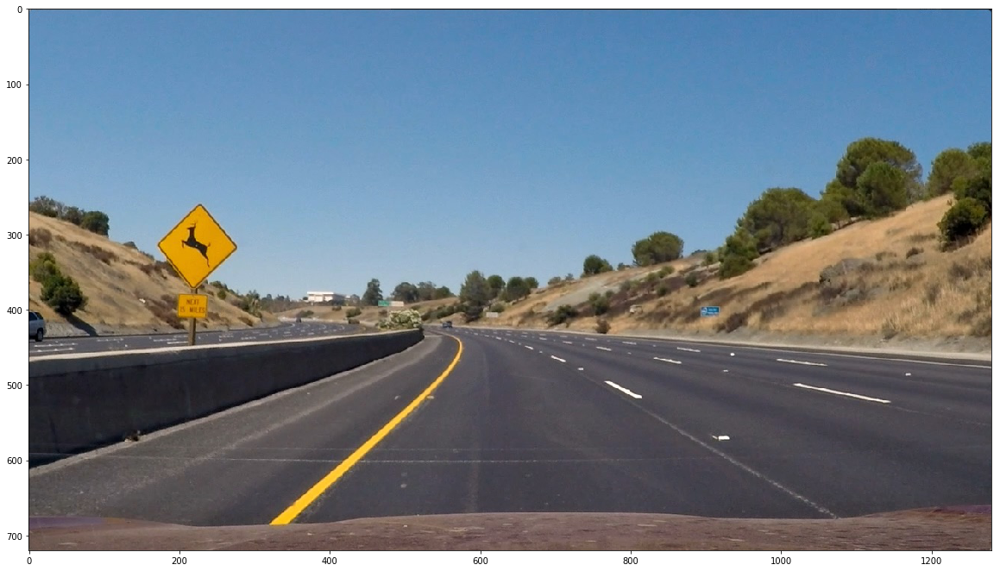

car 0.62 (327, 306) (395, 399)
car 0.65 (275, 297) (350, 430)
car 0.66 (0, 301) (57, 498)
car 0.66 (181, 288) (297, 447)
car 0.66 (778, 307) (886, 410)
car 0.76 (1085, 317) (1280, 628)
car 0.77 (35, 307) (179, 472)
car 0.87 (934, 313) (1147, 504)
car 0.89 (570, 317) (791, 500)
Found 9 boxes for test_images/2.jpg


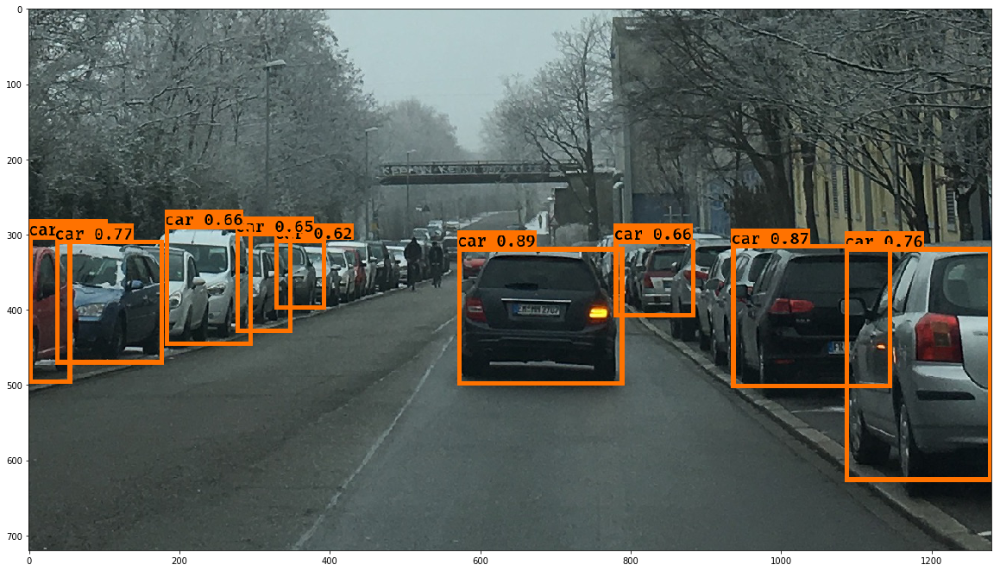

car 0.66 (218, 409) (357, 524)
car 0.73 (381, 354) (709, 645)
car 0.73 (828, 372) (1241, 651)
car 0.81 (694, 404) (874, 531)
Found 4 boxes for test_images/1.jpg


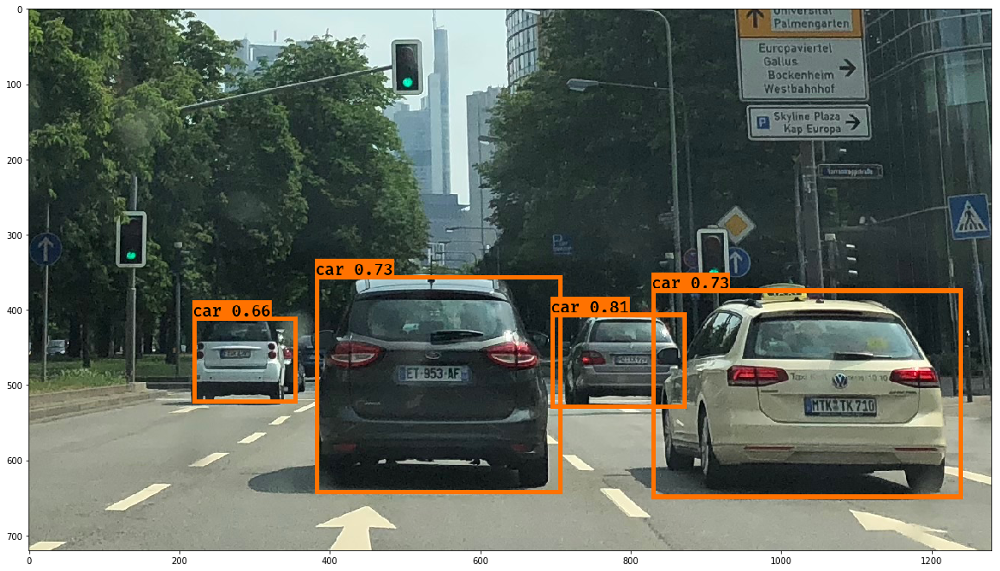

In [15]:
import PIL

img_path = glob.glob('test_images/*')

for f in img_path:
    image = PIL.Image.open(f)
    out_scores, out_boxes, out_classes, output_image = predict(sess,image,True,scores,boxes,all_classes,class_names=class_names)
    print('Found {} boxes for {}'.format(len(out_boxes), f))
    fig=plt.figure(figsize=(20, 20))
    plt.imshow(output_image)
    plt.show()

## 6. Put them together

In [16]:
import numpy as np

def pipline(img):
    img = PIL.Image.fromarray(img)
    out_scores, out_boxes, out_classes, output_image = predict(sess,img,False,scores,boxes,all_classes,class_names=class_names)
    return np.array(output_image)

## 7. Run on video

In [17]:
from moviepy.editor import VideoFileClip

video_output = 'project_video_output.mp4'

clip1 = VideoFileClip("project_video.mp4")
img_clip = clip1.fl_image(pipline) #NOTE: this function expects color images!!
%time img_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [33:22<00:01,  1.59s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1h 35min 1s, sys: 9min 46s, total: 1h 44min 47s
Wall time: 33min 23s


In [18]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))